# Latch and Flip-Flop Exercises

## Exercise 1

Implement a D flip-flop in DEEDS and simulate its behavior using a timing diagram that shows it is transparent only at the rising edge of the clock and that, at all other times, it retains its previously stored value. Then use this circuit to create a reusable block that can be incorporated into other designs:

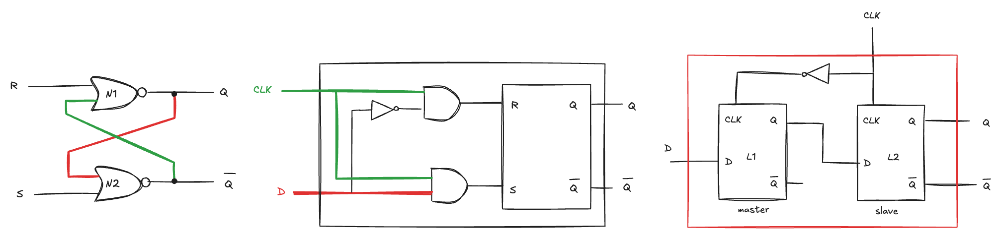

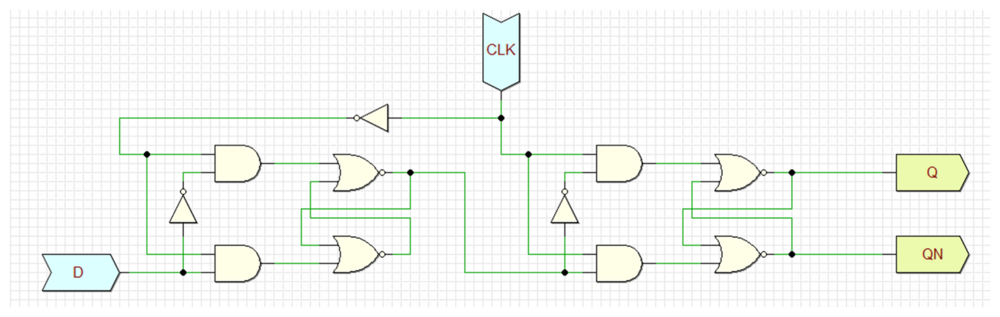

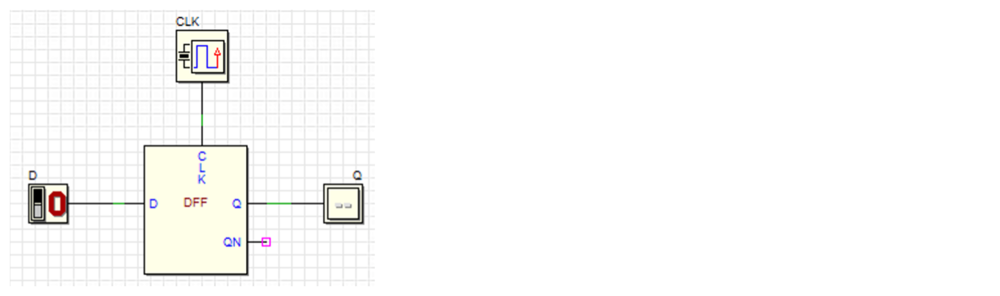

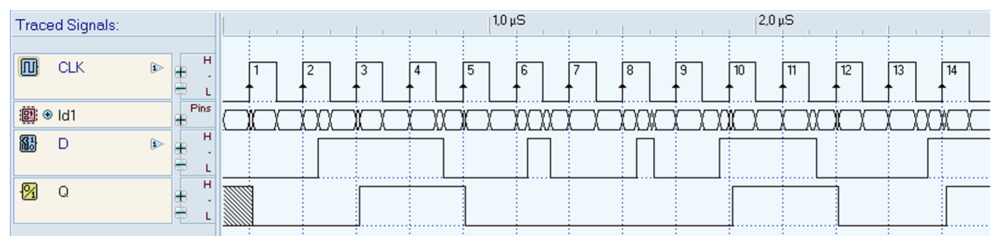

## Exercise 2

Consider the following behavioral descriptions of different types of flip-flops. For each type, design a possible implementation, build it in DEEDS, verify its operation using a timing diagra and write the VHDL code that describes its behavior.

### (a) Toggle Flip-Flop

The toggle (T) flip-flop inverts its output on every active clock edge when T is high, producing a clean alternating sequence that effectively divides the clock frequency by two.

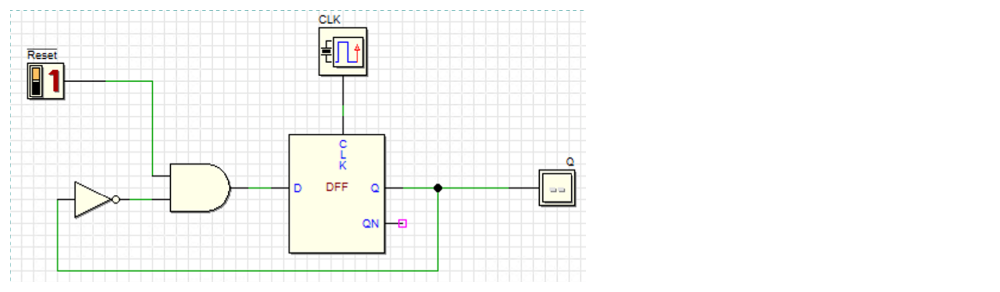

The T flip-flop needs a reset because its behavior depends entirely on its previous stored value; without initializing Q to a known state at power-up, the flip-flop begins in an undefined condition and produces unpredictable output sequences.

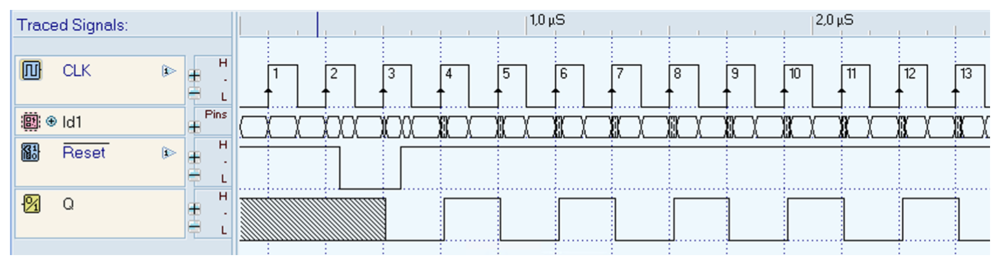

In [ ]:
library ieee;
use ieee.std_logic.ALL;

entity TFF is
    Port ( 
        CLK   : in  std_logic;
        Reset : in  std_logic;
        Q     : out std_logic;
        QN    : out std_logic
    );
end TFF;

architecture Behavioral of TFF is
    signal D_internal : std_logic;
    signal Q_internal : std_logic;
    signal Reset_inv  : std_logic;
begin
    -- Inverter for Reset signal
    Reset_inv <= not Reset;
    
    -- AND gate combining inverted Reset with feedback from Q
    D_internal <= Reset_inv and Q_internal;
    
    -- D Flip-Flop process
    process(CLK, Reset)
    begin
        if Reset = '1' then
            -- Asynchronous reset
            Q_internal <= '0';
        elsif rising_edge(CLK) then
            -- On clock rising edge, transfer D to Q
            Q_internal <= D_internal;
        end if;
    end process;
    
    -- Output assignments
    Q  <= Q_internal;
    QN <= not Q_internal;

end Behavioral;

### (b) JK Flip-Flop

A JK flip-flop receives a clock and two inputs, J and K. It updates its output on each clock edge by setting Q when J=1 and K=0, resetting it when J=0 and K=1, holding its value when both inputs are 0, and toggling when J and K are both 1, making it a versatile device that can act as a set/reset flip-flop, a memory cell, or a toggle depending on its inputs.

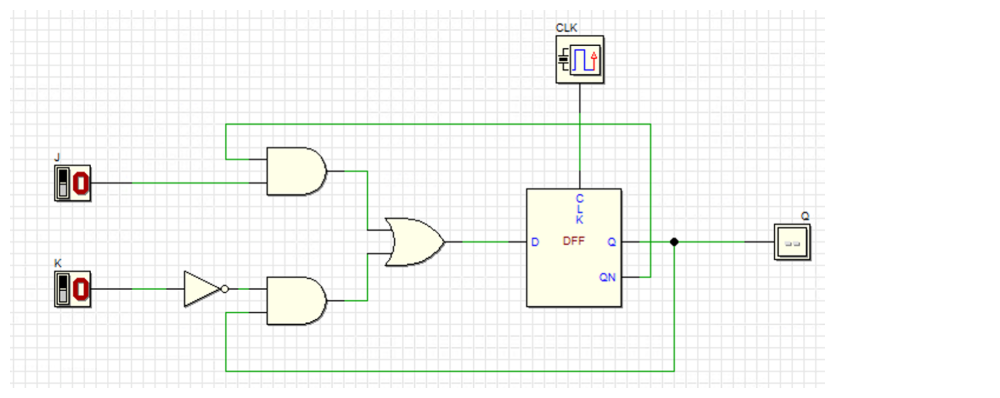

| $J$ | $K$ | $Clk$ | $Q$              | $\overline{Q}$   |                 |
|-----|-----|-------|------------------|------------------|-----------------|
| 0   | 0   | ↑     | $Q_p$            | $\overline{Q}_p$ | Previous state  |
| 1   | 0   | ↑     | 1                | 0                | SET command     |
| 0   | 1   | ↑     | 0                | 1                | RESET command   |
| 1   | 1   | ↑     | $\overline{Q}_p$ | $Q_p$            | Toggle          |

A JK flip-flop can act as an SR flip-flop by using J and K as set and reset inputs, as a D flip-flop by driving J with D and K with the complement of D, and as a T flip-flop by tying J and K together so that a high input makes it toggle

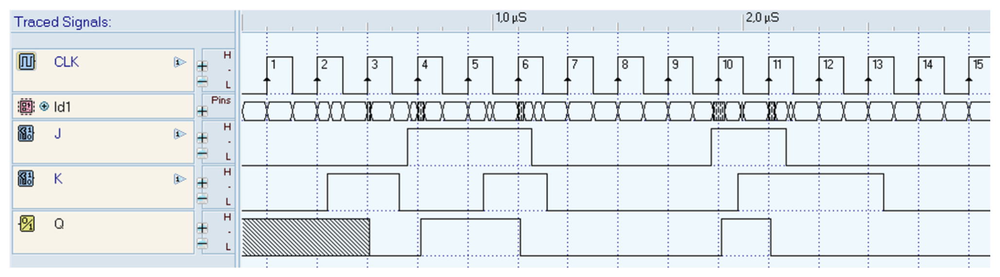

In [ ]:
library ieee;
use ieee.std_logic.ALL;

entity jk_flipflop is
    Port ( 
        J   : in  std_logic;
        K   : in  std_logic;
        CLK : in  std_logic;
        Q   : out std_logic;
        QN  : out std_logic
    );
end jk_flipflop;

architecture Behavioral of jk_flipflop is
    signal Q_internal  : std_logic := '0';
    signal QN_internal : std_logic := '1';
    signal D_input     : std_logic;
    signal K_inv       : std_logic;
    signal and1_out    : std_logic;
    signal and2_out    : std_logic;
begin
    -- Inverter for K input
    K_inv <= not K;
    
    -- Upper AND gate: J AND QN
    and1_out <= J and QN_internal;
    
    -- Lower AND gate: K_inv AND Q
    and2_out <= K_inv and Q_internal;
    
    -- OR gate to generate D input
    D_input <= and1_out or and2_out;
    
    -- D Flip-Flop process
    process(CLK)
    begin
        if rising_edge(CLK) then
            Q_internal <= D_input;
            QN_internal <= not D_input;
        end if;
    end process;
    
    -- Output assignments
    Q  <= Q_internal;
    QN <= QN_internal;

end Behavioral;

Alternative implementation using JK flip-flop behavior directly:

In [ ]:
library ieee;
use ieee.STD_LOGIC_1164.ALL;

entity jk_flipflop_behavioral is
    Port ( 
        J   : in  std_logic;
        K   : in  std_logic;
        CLK : in  std_logic;
        Q   : out std_logic;
        QN  : out std_logic
    );
end jk_flipflop_behavioral;

architecture Behavioral of jk_flipflop_behavioral is
    signal Q_internal : std_logic := '0';
begin
    process(CLK)
    begin
        if rising_edge(CLK) then
            case (J & K) is
                when "00" => Q_internal <= Q_internal;     -- No change
                when "01" => Q_internal <= '0';            -- Reset
                when "10" => Q_internal <= '1';            -- Set
                when "11" => Q_internal <= not Q_internal; -- Toggle
                when others => Q_internal <= Q_internal;
            end case;
        end if;
    end process;
    
    -- Output assignments
    Q  <= Q_internal;
    QN <= not Q_internal;

end Behavioral;

### (c) Asynchronous Preset and Clear Flip-Flop

We already considered a reset input for flip-flops, which allows us to force the output Q to 0 regardless of the clock or data inputs. However, we considered only a **synchronous reset**, which acts only on the active clock edge. In many applications, it is useful to have asynchronous inputs that can override the normal operation of the flip-flop at any time, without waiting for a clock event. Preset and Clear are **asynchronous inputs** that let us immediately force a flip-flop into a known state (Preset driving the output high and Clear driving it low), so the circuit can **start up correctly**, **recover from faults**, or be placed instantly in a controlled condition without waiting for a clock edge. Modify the D flip-flop block in order to add a Set inputs, and simulate its operation with a timing diagram that shows how this input override the normal D and clock behavior. Then try the DEEDS library flip-flop with preset and clear inputs and compare its behavior with your design.


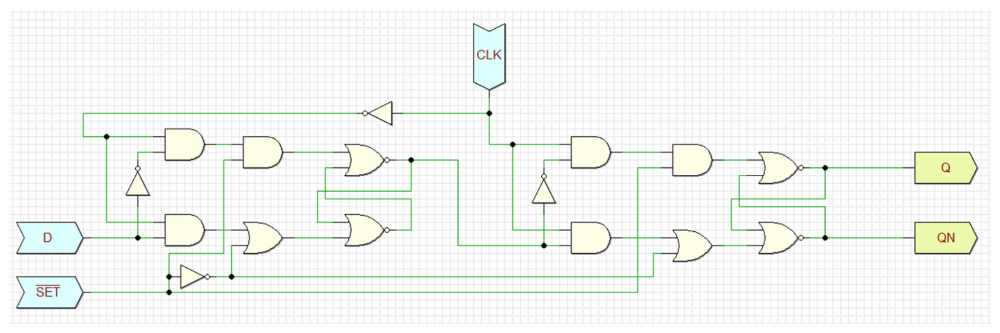

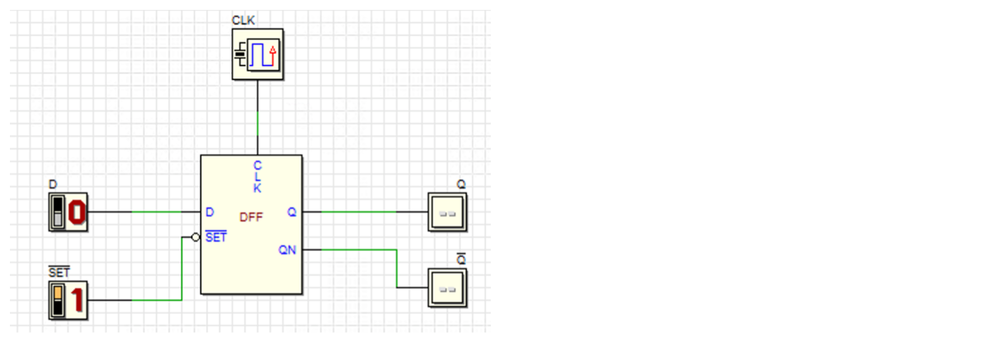

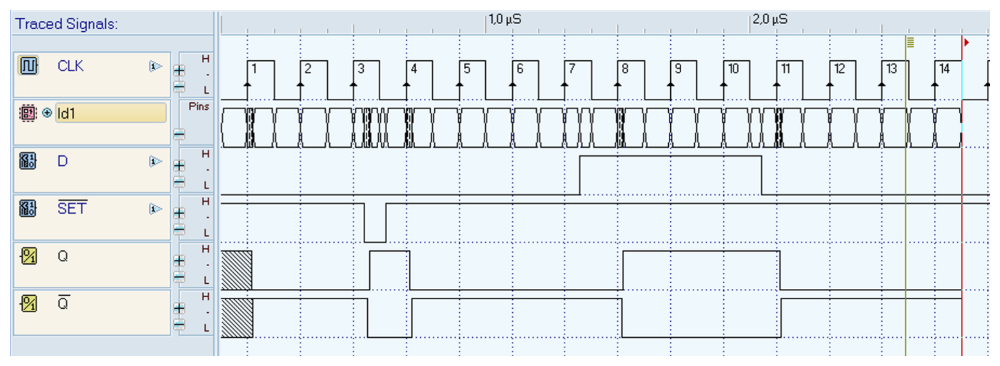

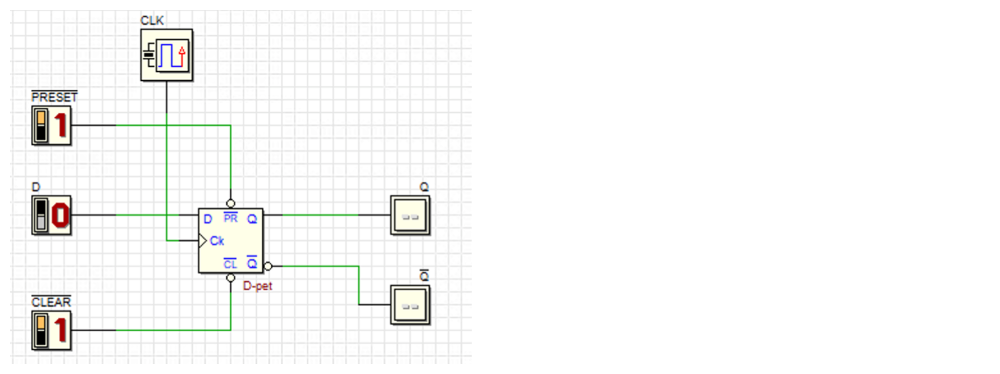

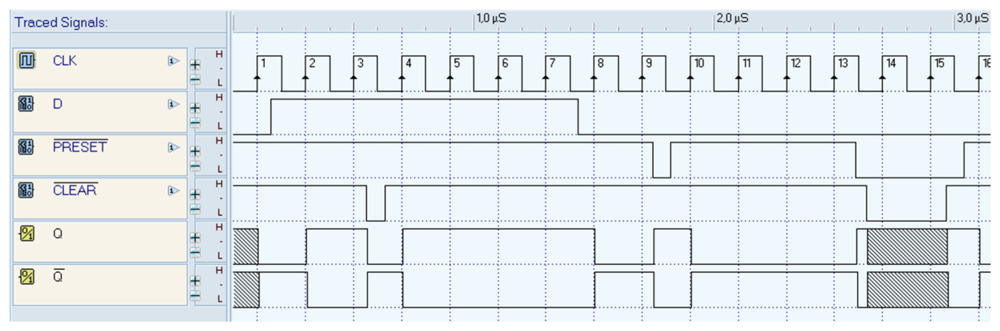

In [ ]:
library ieee;
use ieee.std_logic_1164.all;

entity d_flipflop_clear_preset is
    Port ( 
        D       : in  std_logic;
        CLK     : in  std_logic;
        CLR_n   : in  std_logic;  -- Active-low Clear (asynchronous)
        PRE_n   : in  std_logic;  -- Active-low Preset (asynchronous)
        Q       : out std_logic;
        QN      : out std_logic
    );
end d_flipflop_clear_preset;

architecture Behavioral of d_flipflop_clear_preset is
    signal Q_internal : STD_LOGIC;
begin
    process(CLK, CLR_n, PRE_n)
    begin
        -- Check for illegal condition (both Clear and Preset active)
        if (CLR_n = '0' and PRE_n = '0') then
            -- Illegal state - typically set both Q and QN to '1' or handle as needed
            Q_internal <= '1';  -- Or could be 'X' for unknown
            
        elsif CLR_n = '0' then
            -- Asynchronous Clear (active-low) - has priority after illegal check
            Q_internal <= '0';
            
        elsif PRE_n = '0' then
            -- Asynchronous Preset (active-low)
            Q_internal <= '1';
            
        elsif rising_edge(CLK) then
            -- Normal D flip-flop operation on clock rising edge
            Q_internal <= D;
        end if;
    end process;
    
    -- Output assignments
    Q  <= Q_internal;
    QN <= not Q_internal;

end Behavioral;

## Exercise 3

Analyze the following synchronous sequential circuits by completing the timing diagrams. First draw the waveforms by hand and then use DEEDS only to verify your solutions.

### (a) 

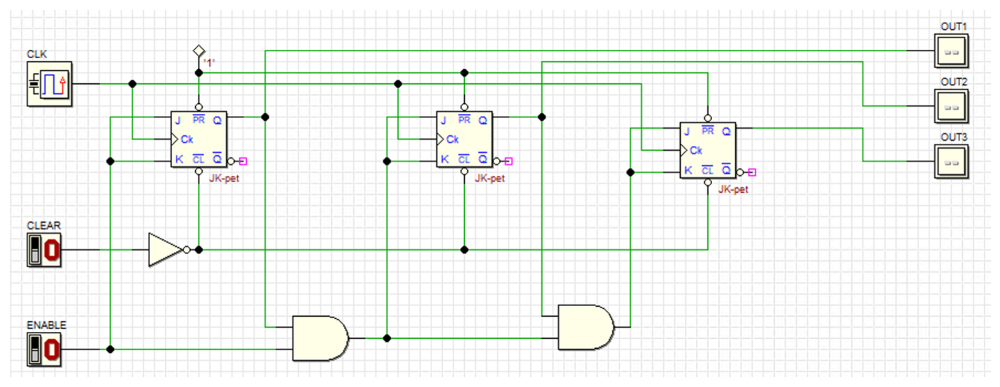

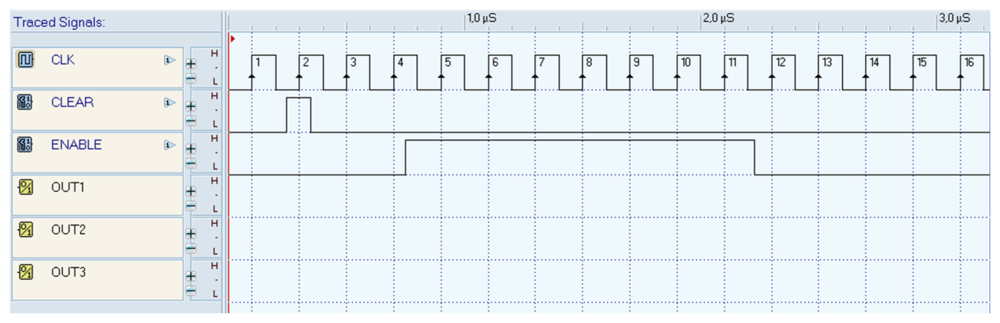

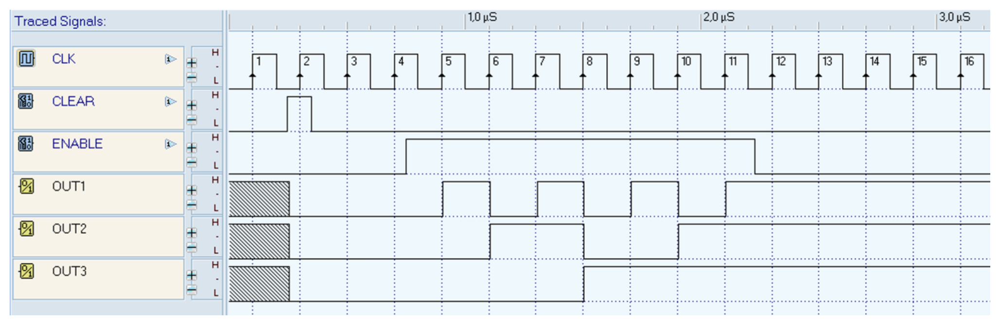

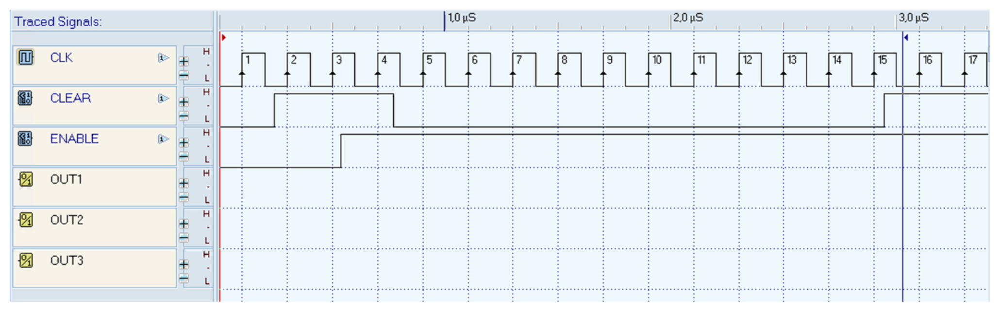

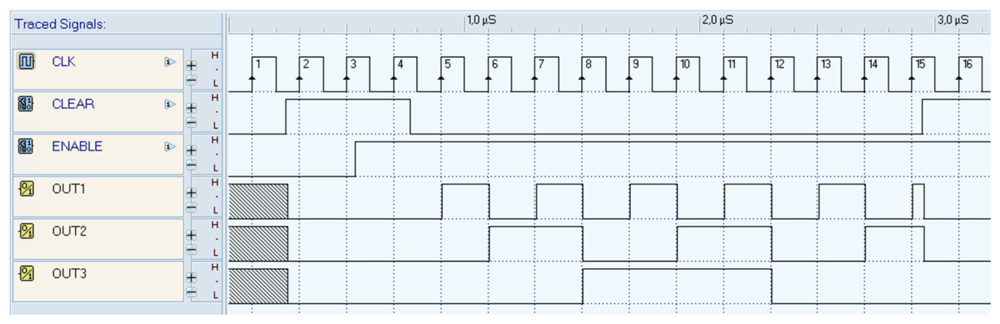

### (b)

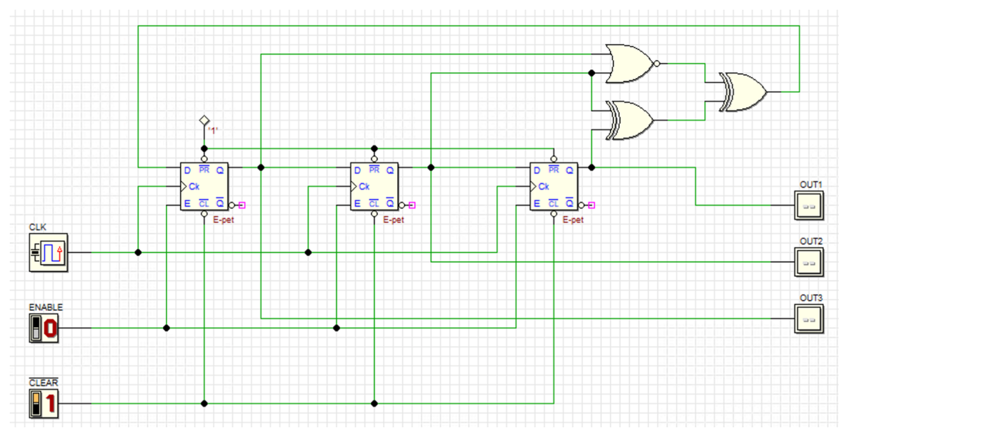

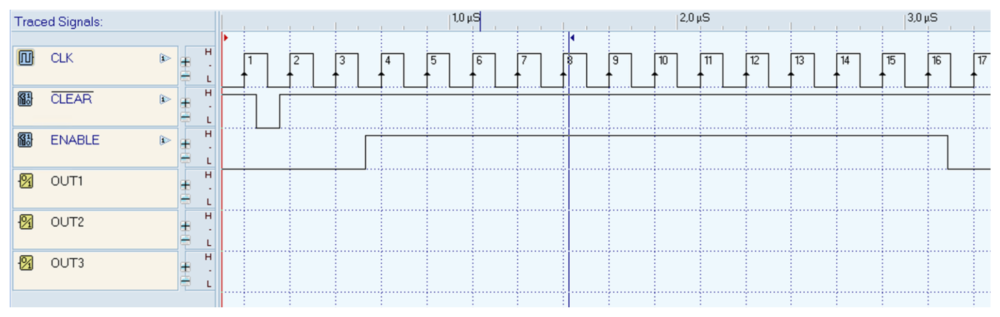

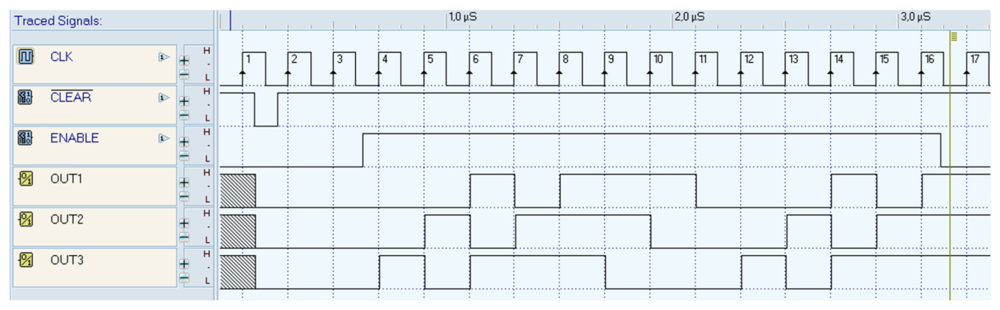

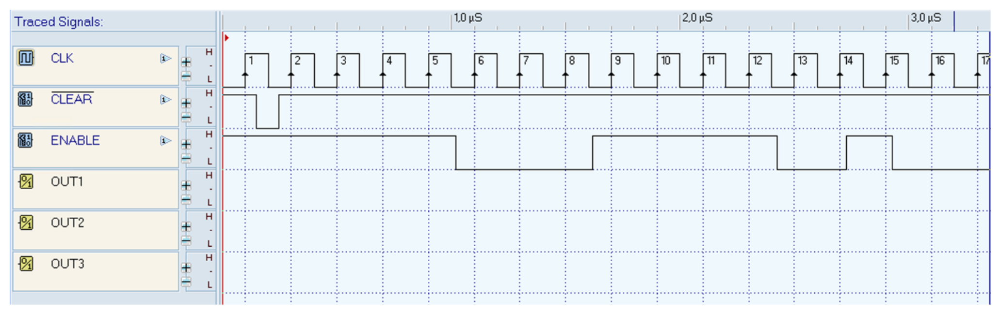

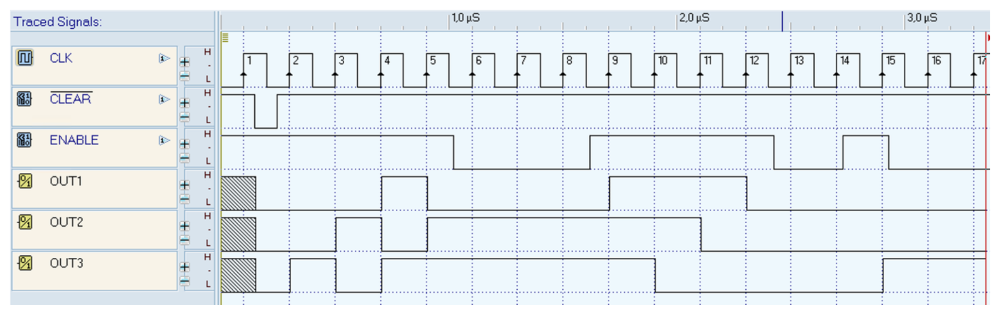

### (c)

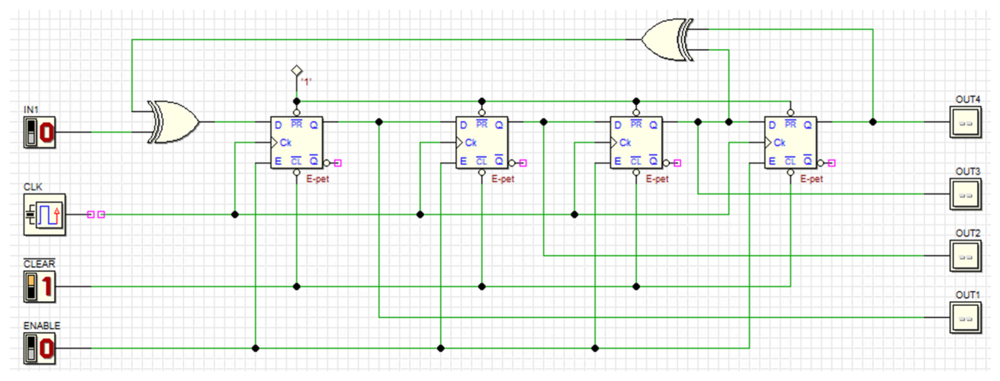

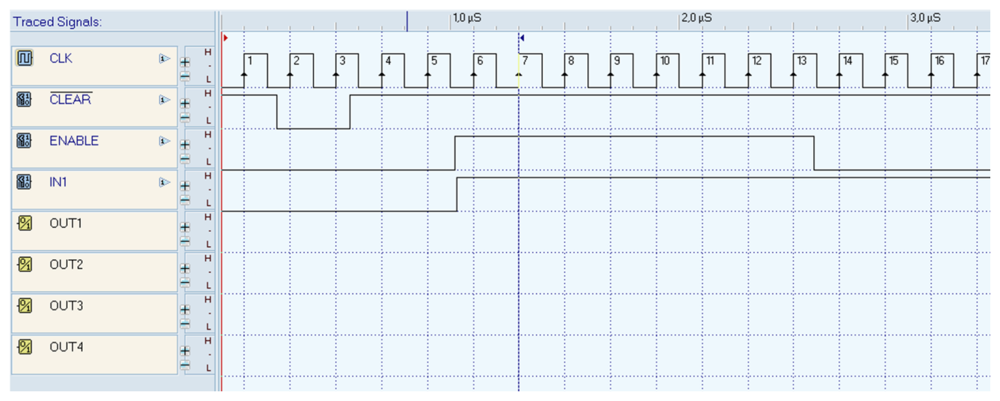

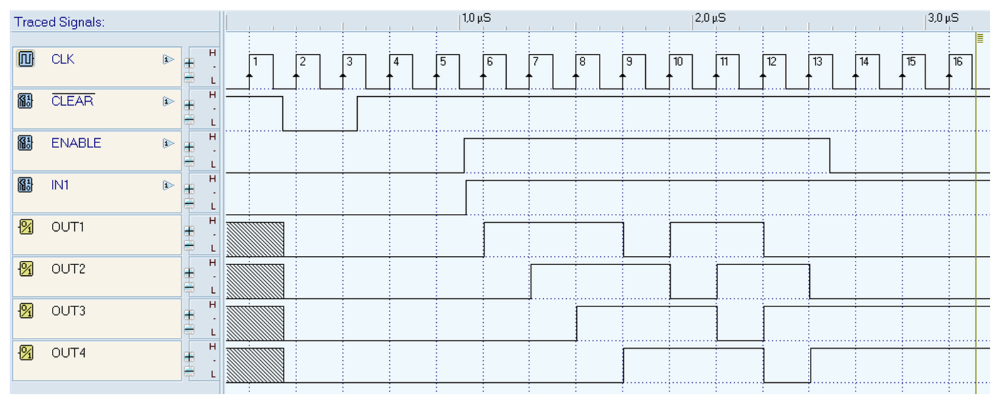